# Visión artificial aplicada a la industria
### Intecol SAS
## Taller 2: Alineacion de imagenes


Sergey Mikhaylovich Prokudin-Gorsky(Ruso , Agosto 30 de 1863-septiembre 27 de 1944) fue un quimico y fotografo ruso , que es mejor conocido por ser pionero en el trabajo del color de la fotografia .

El metodo de fotografia a color fue sugerido en 1955 por James Clerk Maxwell y demostrado en 1861, en imitacion en la forma en que los ojos humanos perciben el color , el espectro visible de los colores es dividido en tres canales de informacion, capturandolo en tres fotografias a blanco y negro, una tomado con un filtro rojo , despues otra tomada con un filtro verde y finalmente un filtro azul. Esas tres fotogrfias pueden ser proyectadas en filtros del mismo color y ser interpuestas en una pantalla, sintetizando el rango original de colores aditivamente .

<img src="images/Alleia_Hamerops_composite.jpg">

En este Taller debes hacer un programa que alinee las imagenes de cada uno de los canales para dar lugar a una imagen  a color .





In [3]:
%pylab inline
import matplotlib.pyplot as plt 
import numpy as np
from PIL import Image
import os
from skimage.io import imread
import skimage.filters as filters

Populating the interactive namespace from numpy and matplotlib


La imagen de entrada es un conjunto de 3 placas de fotografia , correspondientes a los canales B,G y R (de arriba hacia abajo).

### se debe crear una funcion (load data) que lea las imagenes de la carpeta "plates" y que devuelva una lista de imagenes.

Ayuda : Utilizar endswith('.png') en un condicional

In [4]:
def load_data(dir_name = 'plates'):
    images = []

    ''' Escriba aca su codigo'''
    for i in os.listdir(dir_name):
        if i.endswith('.png'):            
            pilImage=imread(f"{dir_name}/{i}",as_gray=True)
            images.append(pilImage)
            
    return images

plates = load_data()


## visualizacion del conjunto de datos

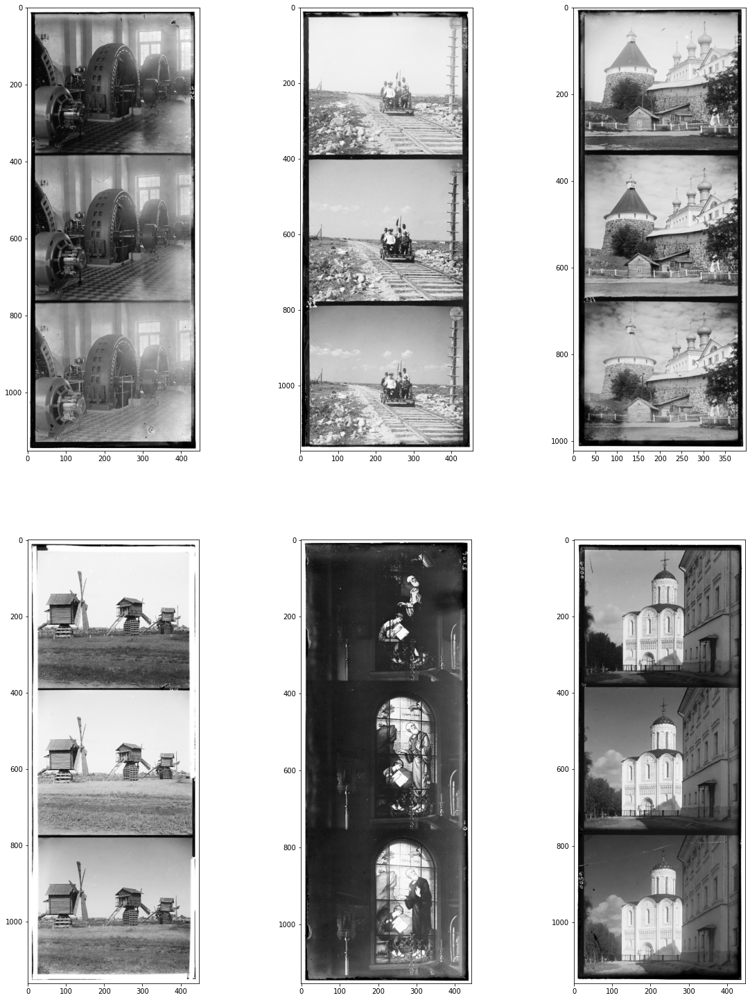

In [5]:
def visualize(imgs, format=None):
    plt.figure(figsize=(20, 40))
    for i, img in enumerate(imgs):
        if img.shape[0] == 3:
            img = img.transpose(1,2,0)
        plt_idx = i+1
        plt.subplot(3, 3, plt_idx)    
        plt.imshow(img, cmap=format)
    plt.show()

visualize(plates, 'gray')

## Recortar Bordes
Cree una Funcion "remove_borders" que tenga como entrada una imagen y un numero float que sera un porcentaje (0-100), se debe recortar dicho porcentaje de la imagen en todos sus lados para asi eliminar los molestos bordes

In [6]:
def remove_borders(img,percentage):
    """ Escriba Aca su codigo"""   
    dx = int(img.shape[1] * percentage/100) 
    return img[dx : -dx, dx : -dx]


cropped_imgs = []
#crop borders
for i, img in enumerate(plates):
    cropped_imgs.append(remove_borders(img,6))

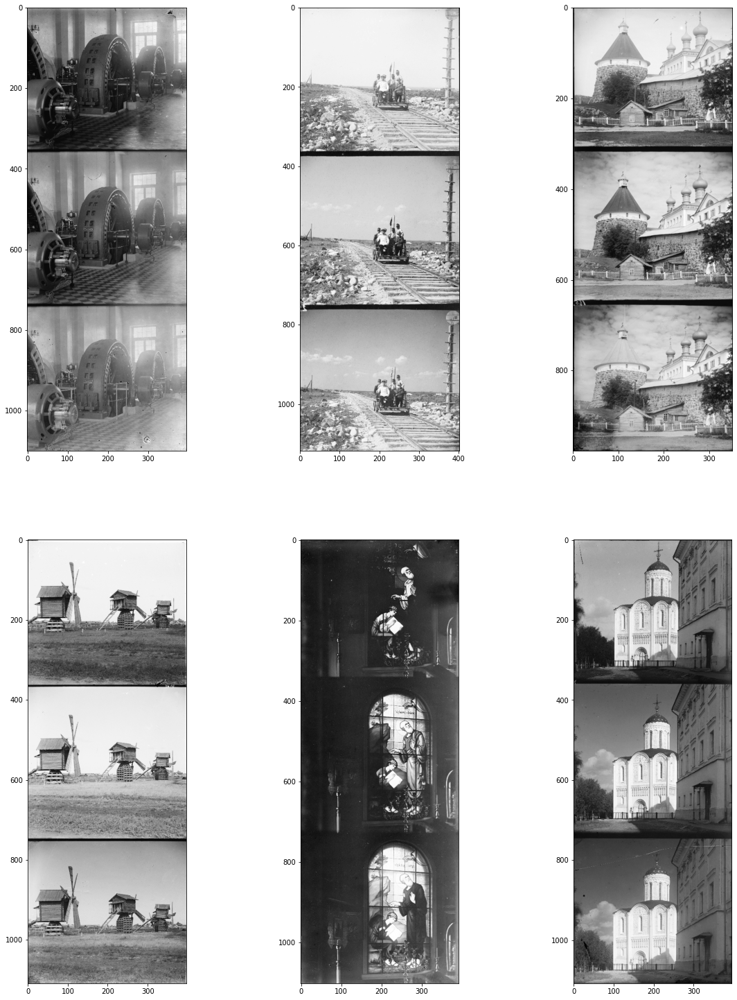

In [7]:
visualize(cropped_imgs, 'gray')

## Separacion por canales

El proximo paso es separar la imagen en 3 canales y obtener una imagen a color (RGB)

Nota: Recuerde que los canales de la imagen vienen como  B,G y R (de arriba hacia abajo).



In [8]:
def impose_components(img):
    img_size = int(img.shape[0]/3)
    B = img[0:1*img_size,::]    
    G = img[1*img_size:2*img_size,::]
    R = img[2*img_size:3*img_size,::]
    rgb=np.stack((R,G,B),axis= -1)
    return rgb


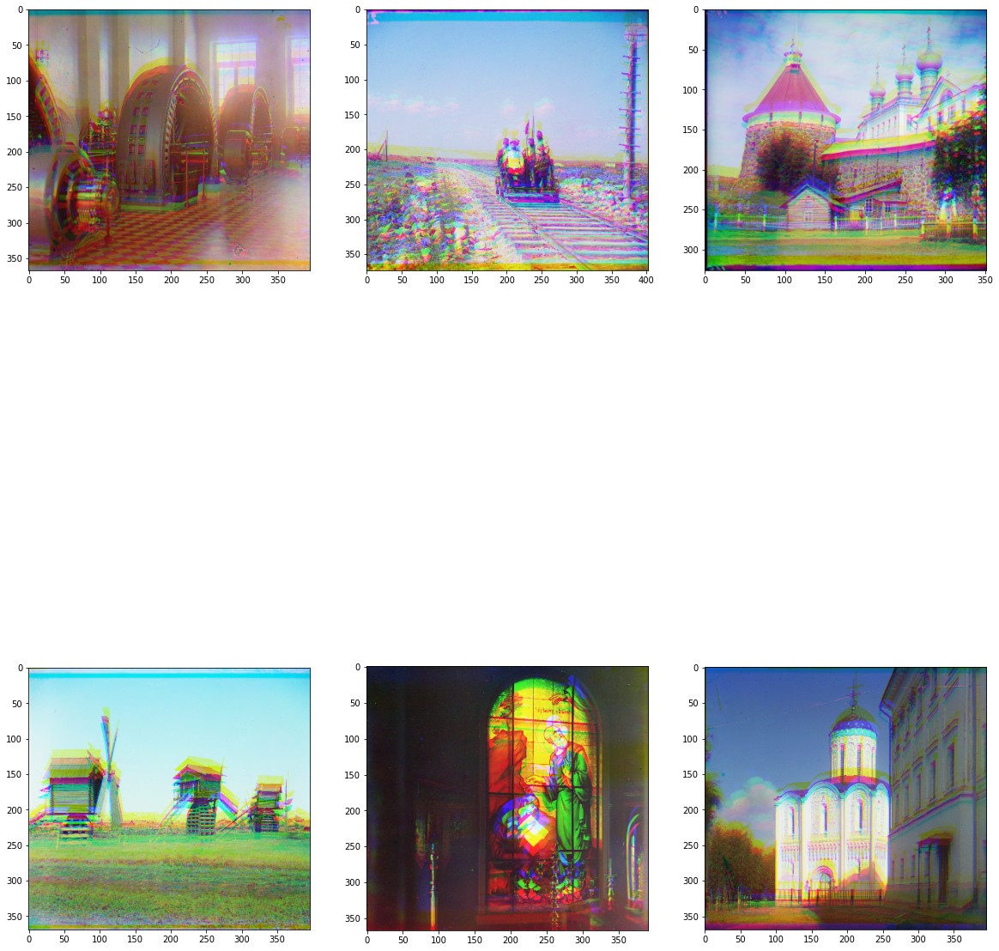

In [9]:
rgb_imgs = []
for cropped_img in cropped_imgs:
    rgb_img = impose_components(cropped_img)
    rgb_imgs.append(rgb_img)

visualize(rgb_imgs) 

## Buscar la mejor alineacion de las imagenes

Felicidades, ya tenemos nuestra imagen a color , sin embargo como te habras dado cuenta los canales no se encuentran alineados correctamente.
Para lograr la mejor alineacion entre dos imagenes tenemos que desplazar una imagen respecto a la otra dentro de unos limites establecidos . Para cada desplazamiento tenemos que evaluar unas metricas de superposicion  de las imagenes. Dependiendo de dichas metricas , el mejor desplazamiento es aquel en el que las metricas equivalen a el mayor o el menor valor.

Se deben implementar dos metricas y elegir la metrica con la que obtienes mejor calidad de alineamiento:


* *Error cuadratico medio - Mean squared error(MSE):* <br><br>
$$ MSE(I_1, I_2) = \dfrac{1}{w * h}\sum_{x,y}(I_1(x,y)-I_2(x,y))^2, $$ <br> Donde *w, h* son el ancho y el alto de las imagenes , respectivamente . Para encontrar el desplazamiento optimo se debe encontrar el minimo MSE sobre todos los valores de desplazamiento.
    <br><br>

* *Correlacion-cruzada normalizada - Normalized cross-correlation (CC):*<br><br>
    $$
    I_1 \ast I_2 = \dfrac{\sum_{x,y}I_1(x,y)I_2(x,y)}{\sum_{x,y}I_1(x,y)\sum_{x,y}I_2(x,y)}.
    $$<br>
    Para encontrar el desplazamiento optimo encontrar el maximo CC sobre todo el conjunto de valores de desplazamiento


## Definir las metricas de desplazamiento

Crear dos funciones 'mse' y 'cor' que tenga como entrada dos imagenes X y Y y calcule el mse y el cc respectivamente

In [10]:
def mse(X,Y):
    mse = np.sum((X - Y) ** 2)
    mse /= float(X.shape[0] * X.shape[1])
    return mse
    
def cor(X, Y):
    cc = np.sum(X*Y)
    cc /= (np.sum(X)*np.sum(Y))   
    return cc    

In [11]:
def get_best_shift(ch1, ch2,method):
    mse_min=1
    cc_max=0
    i_min = 0
    j_min = 0
    i_max = 0
    j_max = 0
    ch22=ch2
    iter = 25
    for i in range (-iter,iter):
        for j in range (-iter,iter):
            ch22=np.roll(ch2,[i,j],axis=(0,1))
            mse_1 =(mse(ch1,ch22))
            cc_1 = cor(ch1,ch22)
            if mse_1 < mse_min:
                i_min = i
                j_min = j
                mse_min = mse_1 
            if cc_1 > cc_max:
                i_max = i
                j_max = j
                cc_max = cc_1 
    if (method == 'mse'):

        print(f"i: {i_min} - j: {j_min}, MSE = {mse_min}")
        ch2=np.roll(ch2,[i_min,j_min],axis=(0,1))
    elif (method == 'cc'):
        print(f"i: {i_max} - j: {j_max},CC = {cc_max}")
        ch2=np.roll(ch2,[i_max,j_max],axis=(0,1))
    return ch2


def get_best_image(rgb_img,method):
    #Descomponer la imagen en 3 canales
    r = rgb_img[:,:,0]
    g = rgb_img[:,:,1]
    b = rgb_img[:,:,2]
    
    g = get_best_shift(r,g,method)
    b = get_best_shift(r,b,method)
    rgb=np.dstack((r,g,b))
    return rgb



i: 11 - j: 0, MSE = 0.02543078323956984
i: 22 - j: -2, MSE = 0.043313534732596984
i: 8 - j: 1, MSE = 0.022744634894987993
i: 23 - j: 2, MSE = 0.04627562505358495
i: 7 - j: -1, MSE = 0.01710127926043289
i: 20 - j: -1, MSE = 0.029084575991086704
i: 10 - j: -1, MSE = 0.042675123235533595
i: 21 - j: -3, MSE = 0.04022599203676458
i: 13 - j: 0, MSE = 0.026073505322415338
i: 24 - j: -2, MSE = 0.07144000251166342
i: 9 - j: 0, MSE = 0.009087089148166343
i: 20 - j: -4, MSE = 0.037846500753637775


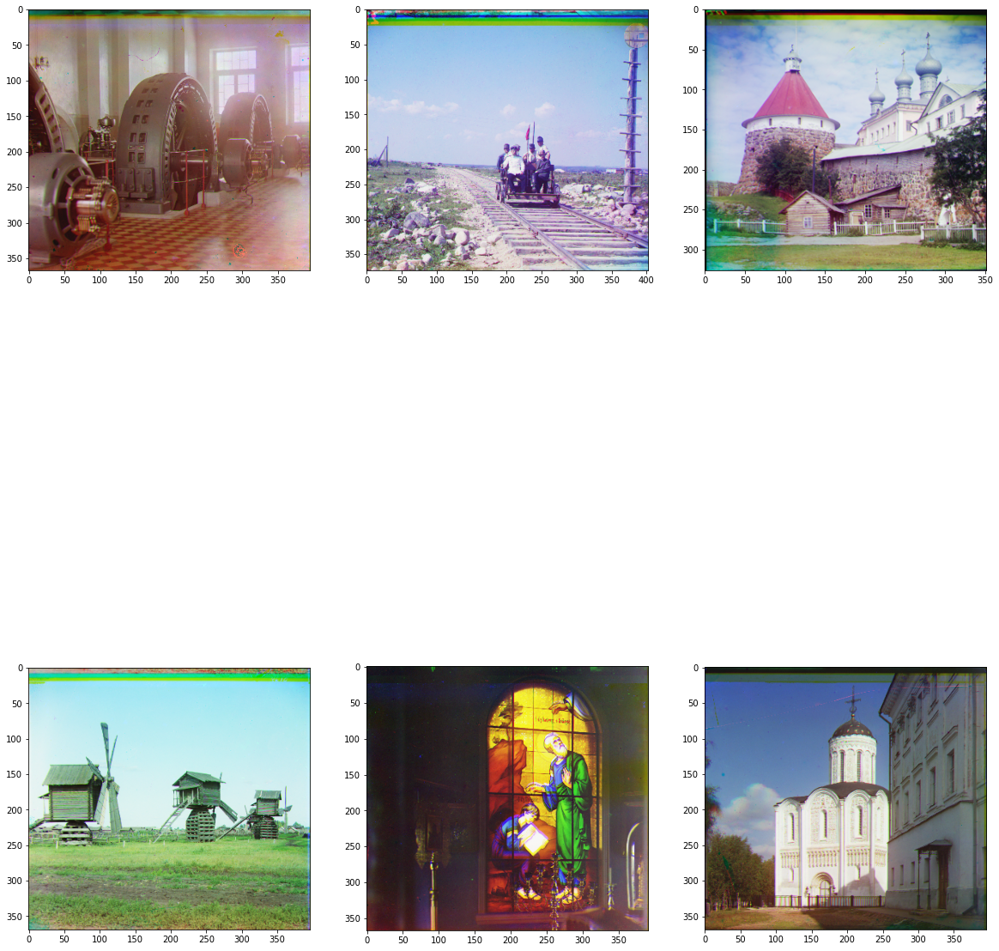

In [12]:
final_imgs = []
method = 'mse'
for img in rgb_imgs:
    final_img = get_best_image(img,method)
    final_imgs.append(final_img)
visualize(final_imgs)

i: 11 - j: 0,CC = 7.717071403458135e-06
i: 22 - j: -2,CC = 7.90412127766208e-06
i: 8 - j: 1,CC = 7.0145098763136785e-06
i: 23 - j: 2,CC = 6.965821481521835e-06
i: 7 - j: -1,CC = 9.837406456622333e-06
i: 20 - j: -1,CC = 9.880185392173056e-06
i: 10 - j: -1,CC = 7.297818066182624e-06
i: 21 - j: -3,CC = 7.647254070114585e-06
i: 13 - j: 0,CC = 1.0174463734961479e-05
i: 24 - j: -2,CC = 8.13415918888172e-06
i: 9 - j: 0,CC = 8.309911446200678e-06
i: 20 - j: -4,CC = 7.98456369154923e-06


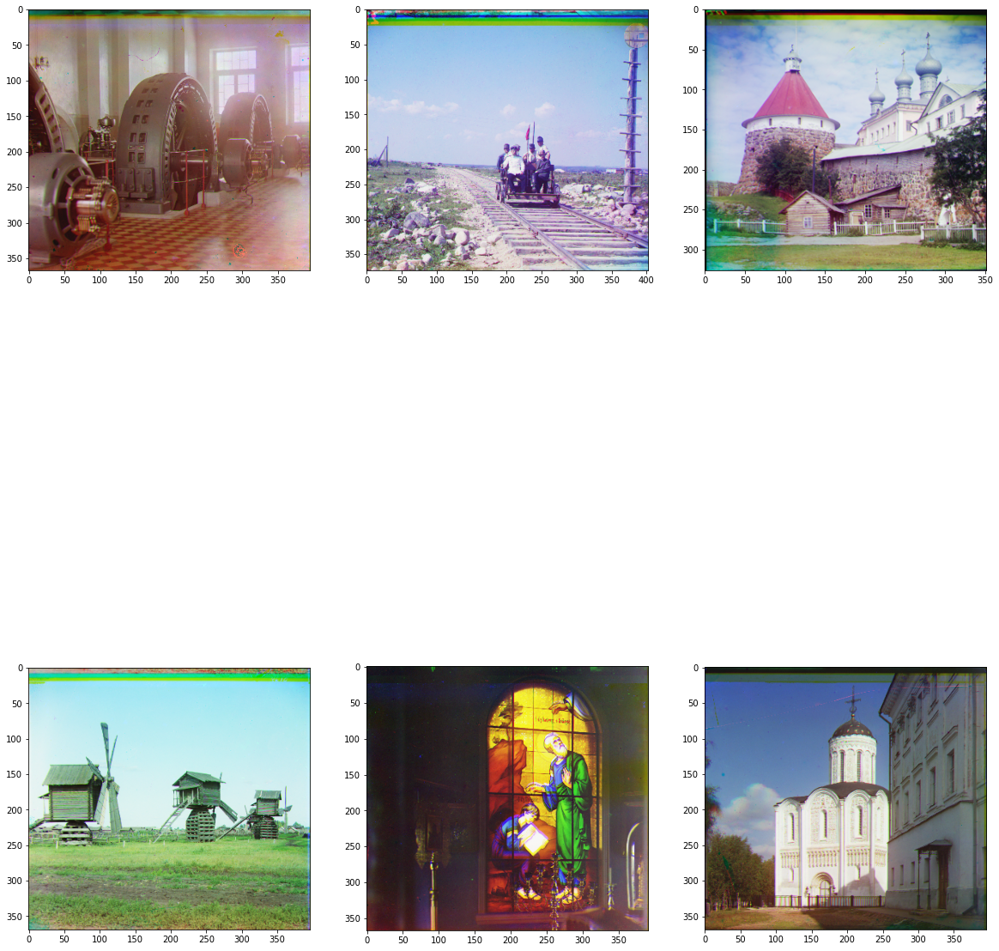

In [13]:
final_imgs = []
method = 'cc'
for img in rgb_imgs:
    final_img = get_best_image(img,method)
    final_imgs.append(final_img)
visualize(final_imgs)